In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
import pickle

## INPUT
The input from this work came from a series of files done in another person's work (Cynthia's student). This student researched subnetworks extracted from Super Pathways. There are 25 networks in total. It branches in types of cancer and Super Pathways.<br>
In this work, I am concerned about genes found in each cancer type. So I open all the networks and join nodes from the same type of cancer.<br>
In the end, I have a set of unique nodes for each cancer type. There are 6 seven cancers, thus, 6 gene sets. I create a consensus of geneset, considering genes that are present in at least 4 cancers.<br>
Finally, we use the consensus set to create sub-networks from Super Pathways.

In [3]:
class PathwayClass:
    def __init__(self, name,idPathway,geneSet,networkWithCCs,networkLCC,drivers):
        self.name = name
        self.id = idPathway
        self.geneSet = geneSet
        self.networkCCs = networkWithCCs
        self.networkLCC = networkLCC
        self.drivers = drivers
        self.topologicalFeaturesLCC = None
        self.layout_LCC_kamada_kawai= None
        self.layout_CCs_spring = None
        self.father = None
        self.children = {}

class PathwaysWrapper:
    def __init__(self, pathwaysObjsIds,pathwaysObjsNames,pathwaysNamesForest,listOfObjects):
        self.pathwaysIds=pathwaysObjsIds
        self.pathwaysNames=pathwaysObjsNames
        self.pathwaysNamesForest=superPathwaysNamesForest
        self.listOfRoots=listOfRoots
        
file = open("1 input/SuperPathwaysAndPathways.pkl", "rb")
pathwaysWrapper = pickle.load(file)


#### Consensus Set

In [4]:
def consensusSet(SuperPathName,threshold):
    allUniqueGenes=set()
    cancerGenes={}
    allUniqueGenesFrequence={}
    for cancerType in ['Cabeça','Estomago','Mama','Pele','Pulmao','Urothelial']:
        cancerGenes[cancerType]=set(pd.read_csv("1 input/"+cancerType+"/matriz_reactome_missense_"+SuperPathName+".csv",index_col=[0]).index)
        for gene in cancerGenes[cancerType]:
            allUniqueGenes.add(gene)

    for gene in allUniqueGenes:
        allUniqueGenesFrequence[gene]=0

    for cancerName in cancerGenes:
        for gene in cancerGenes[cancerName]:
            if gene in allUniqueGenes:
                allUniqueGenesFrequence[gene]+=1

    df=pd.DataFrame([allUniqueGenesFrequence]).T
    freq=df.value_counts()
    print("Frequence in Cancer Types for", SuperPathName.upper())
    print(freq)
    print('Total unique',len(allUniqueGenes))
    selected=list(df[df[0]>threshold].index)
    print('Total selected',len(selected))
    print('-------------')
    return selected


In [62]:
networks={}

#original networks
networks['PCD']=pathwaysWrapper.pathwaysNames['Programmed Cell Death'].networkLCC
networks['CHR']=pathwaysWrapper.pathwaysNames['Chromatin organization'].networkLCC
networks['DNA']=pathwaysWrapper.pathwaysNames['DNA Repair'].networkLCC

#consensus networks
geneSet=consensusSet('death',3)
G=networks['PCD'].copy()
networks['Consensus PCD']=nx.subgraph(G,geneSet)
LCC=max(nx.connected_components(networks['Consensus PCD']),key=len)
networks['Consensus PCD']=nx.subgraph(G,LCC)

geneSet=consensusSet('chromatin',3)
G=networks['CHR'].copy()
networks['Consensus CHR']=nx.subgraph(G,geneSet)
LCC=max(nx.connected_components(networks['Consensus CHR']),key=len)
networks['Consensus CHR']=nx.subgraph(G,LCC)

geneSet=consensusSet('repair',3)
G=networks['DNA'].copy()
networks['Consensus DNA']=nx.subgraph(G,geneSet)
LCC=max(nx.connected_components(networks['Consensus DNA']),key=len)
networks['Consensus DNA']=nx.subgraph(G,LCC)

Frequence in Cancer Types for DEATH
6    76
5    53
4    41
3    17
2     6
1     2
dtype: int64
Total unique 195
Total selected 170
-------------
Frequence in Cancer Types for CHROMATIN
6    122
5     32
4     15
3      8
2      5
1      2
dtype: int64
Total unique 184
Total selected 169
-------------
Frequence in Cancer Types for REPAIR
6    138
5     64
4     33
3     16
2     10
1      3
dtype: int64
Total unique 264
Total selected 235
-------------


In [63]:
print('Number of genes in each network')
for name in ['PCD','CHR','DNA']:
    original=len(networks[name].nodes)
    consensus=len(networks['Consensus '+name].nodes)
    percent=' ('+str(round(consensus/original*100))+'%)'
    print(name+': '+str(original))
    print('Consensus '+name+': '+str(consensus)+percent)
    print('')

Number of genes in each network
PCD: 206
Consensus PCD: 170 (83%)

CHR: 221
Consensus CHR: 162 (73%)

DNA: 300
Consensus DNA: 233 (78%)



## LCC only

In [53]:
for name,G in networks.items():
    networks[name]=nx.subgraph(G,max(nx.connected_components(G),key=len))

In [65]:
[print(name,' | CCs: ',len(list(nx.connected_components(G)))) for name,G in networks.items()];

PCD  | CCs:  1
CHR  | CCs:  1
DNA  | CCs:  1
Consensus PCD  | CCs:  1
Consensus CHR  | CCs:  1
Consensus DNA  | CCs:  1


## Save Networks
LCC only

In [68]:
for name,G in networks.items():
    nx.write_edgelist(G,'1 output\\'+name)

## Plot Networks

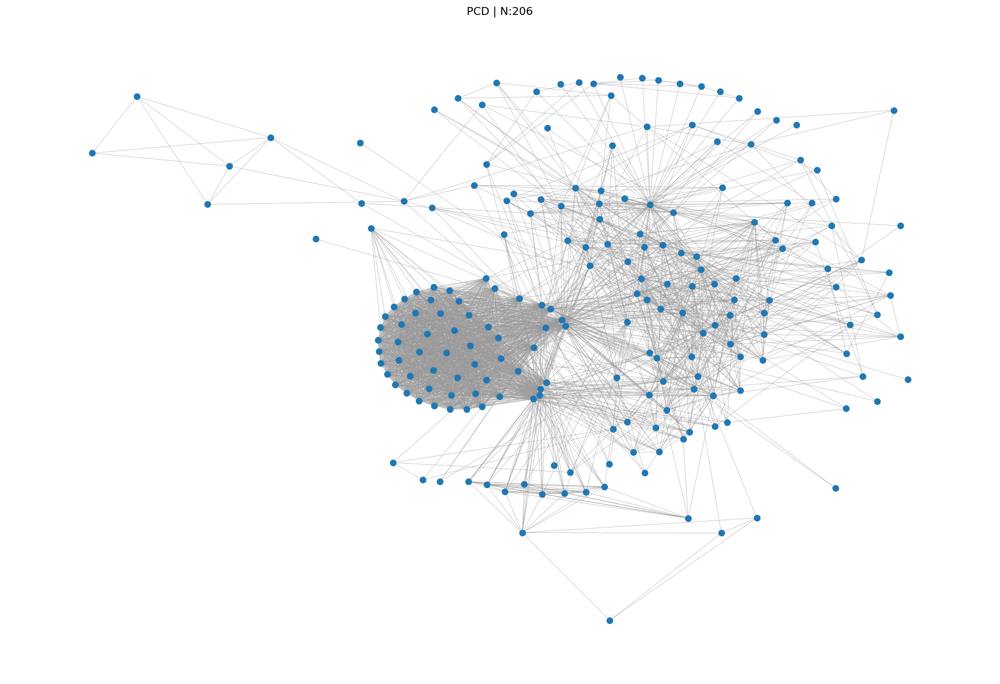

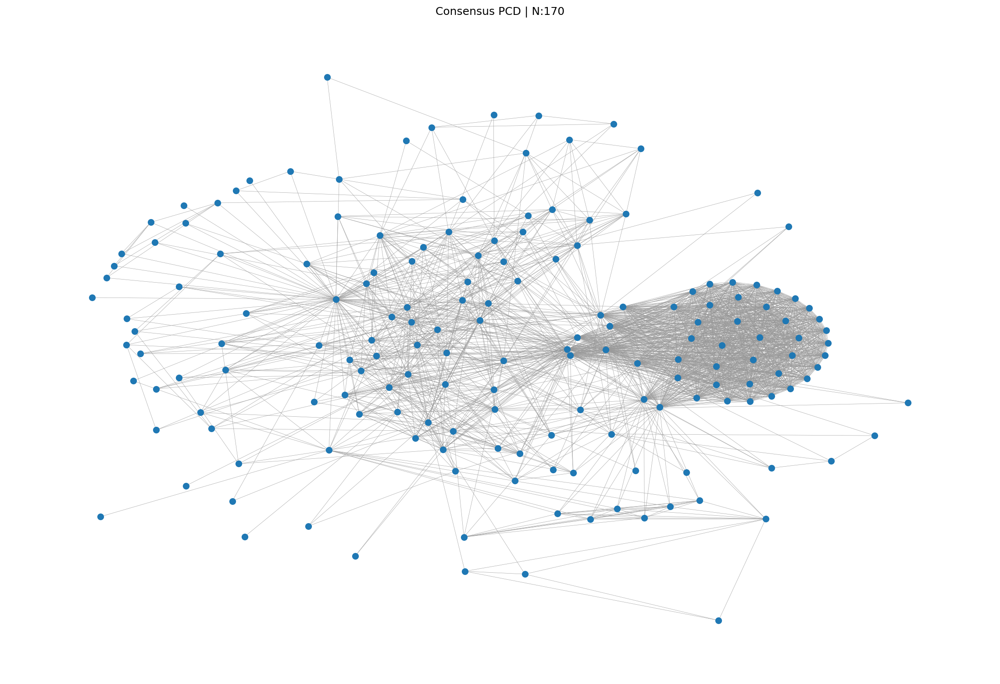

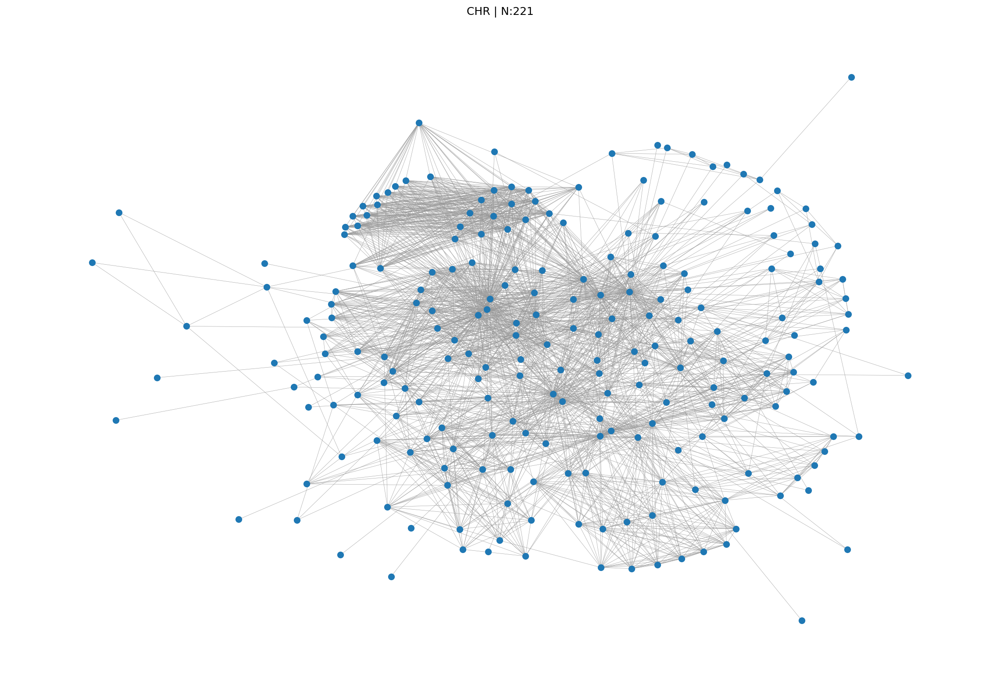

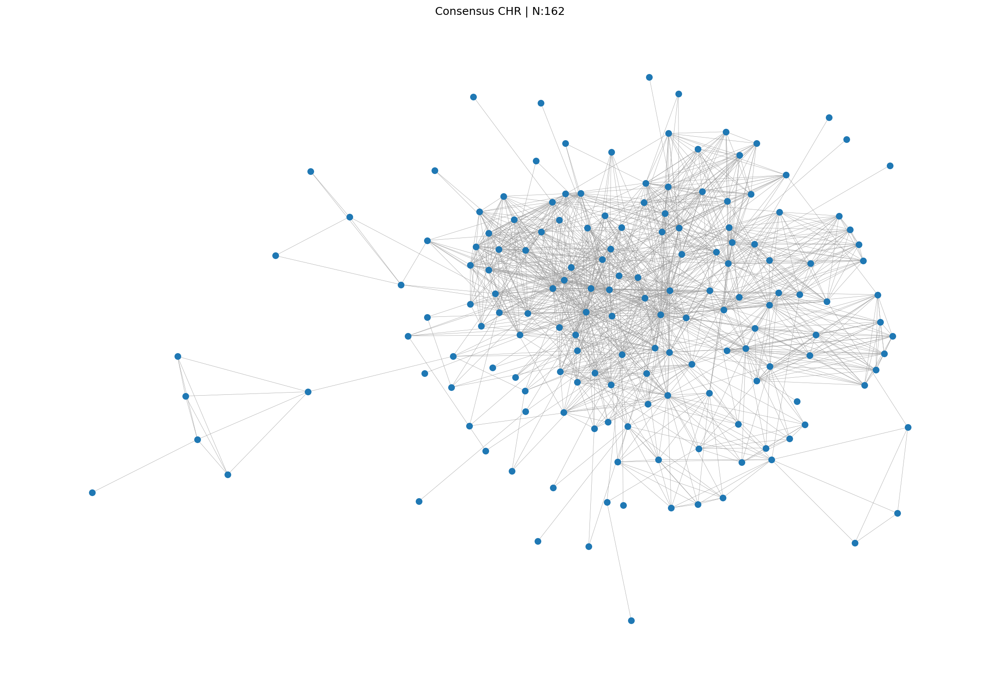

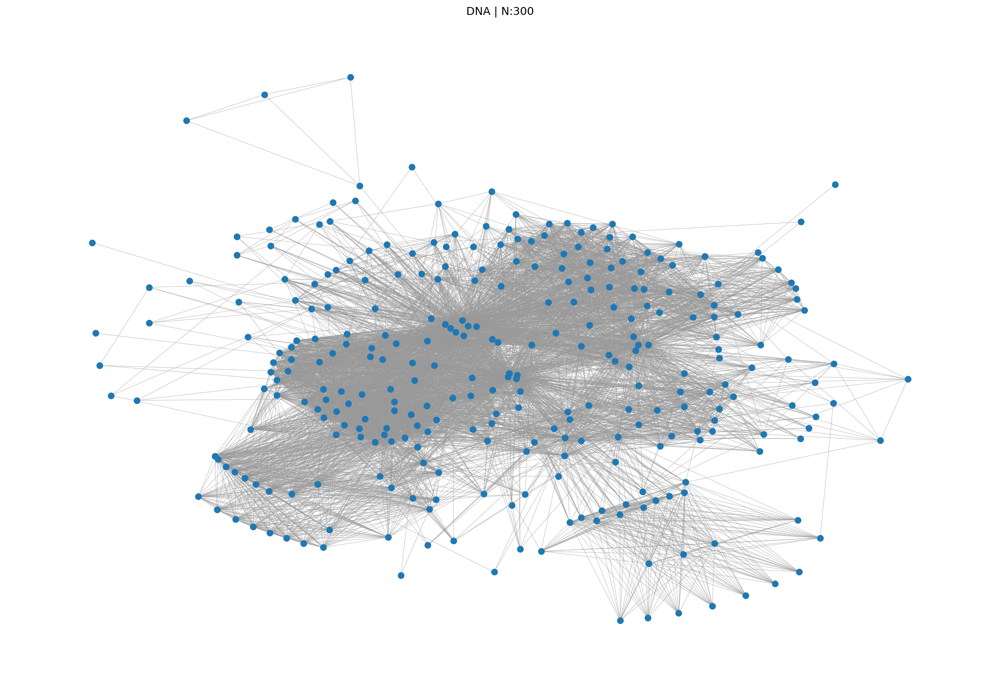

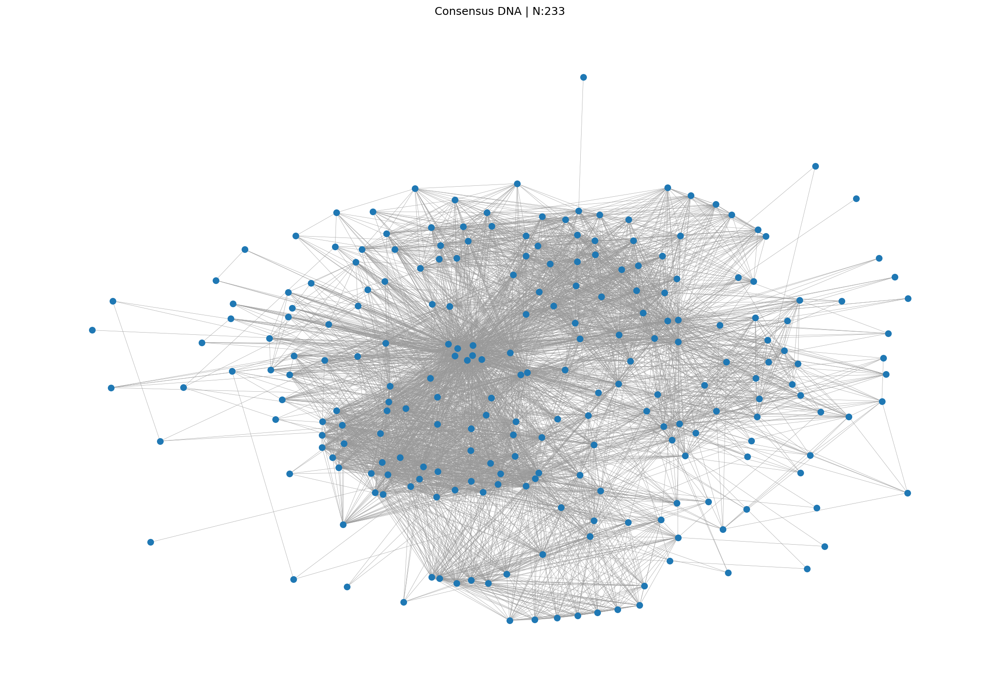

In [71]:
for name in ['PCD','CHR','DNA']:
    G=networks[name]
    consensus=networks['Consensus '+name]
    
    plt.figure(figsize=(15,10),dpi=150)
    nx.draw_kamada_kawai(G,with_labels=0,node_size=40,width=0.3,edge_color='#999')
    plt.title(name+' | N:'+str(len(G.nodes)))
    plt.show()
    
    plt.figure(figsize=(15,10),dpi=150)
    nx.draw_kamada_kawai(consensus,with_labels=0,node_size=40,width=0.3,edge_color='#999')
    plt.title('Consensus '+name+' | N:'+str(len(consensus.nodes)))
    plt.show()